## Project Goals - Predicting the Winner of The International 2022

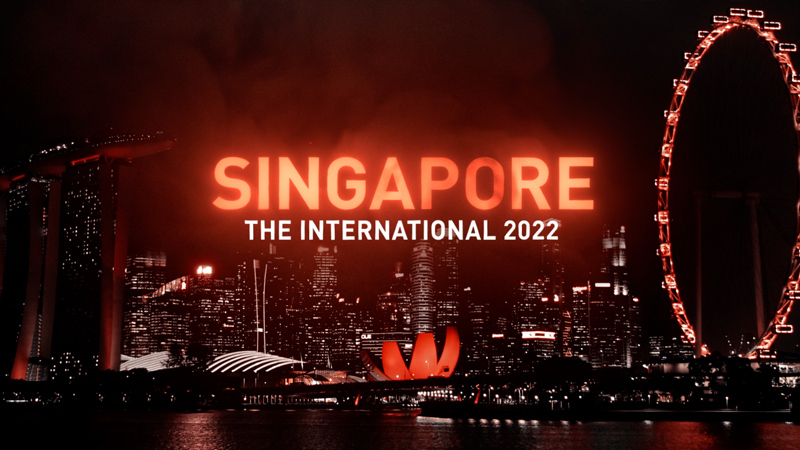

The International is an annual esports world championship tournament for the video game Dota 2, hosted and produced by the game's developer, Valve. The tournament consists of 20 teams; 12 based on final results from the Dota Pro Circuit and six more from winning regional playoffs from the North America, South America, Southeast Asia, China, Eastern Europe, and Western Europe regions, and has since been held annually bar 2020 due to the COVID-19 pandemic. The International remains the biggest and most prestigious event in the Dota 2 professional scene.

The motivation for this project is to extract, process and analyse a data set consisting of both categorical and numerical variables to predict the outcome of a professional match based on the total XPM (experience per minute) gained on a team level. We will assume the role of a data analyst approached by a company looking to set their first foot into the e-sports market through sponsorship, and based on the findings we will then provide them with inform decisions about how best to manage their budget and hopefully increase the success of their next release.

The first step will be tackling data collection - the actual retrieval of data from Opendota, an open source Dota 2 data platform via their API using SQL queries. Subsequently, we'll look at cleaning the data, transforming it into a more useful state, then on to data exploration and analysis. Finally we'll summarise our findings in a non-technical report which would be sent to the fictional company in question.

In [75]:
#import libraries
import requests
import urllib
import urllib.parse
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import sklearn.linear_model as linear_model

from datetime import datetime
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from pandas_profiling import ProfileReport

import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 1000)
pd.options.display.float_format = '{:.2f}'.format #suppress scientific notations when using the Describe function

## SQL Query - Data Gathering

For the purpose of data gathering, the data was initially fetched using the `requests` module as imported above directly form the API, however it was found to be a hindrance due to the following reasons:

* 60 requests/min from the API
* 50,000 free calls/month from the API
* Redundant features that were not useful 

50,000 rows of data would be sufficient for machine learning, however as 60 requests were only allowed every minute, retrieving all the 50,000 requests would take up to 14 hours. Moreover, it was observed that there were many irrelevant columns in the dataset which would consume too much time in data cleaning. Hence to maximise our time efficiency, we took the alternative approach to query the Opendota SQL database instead. 

In [1227]:
query_string = """SELECT table_name, table_schema, table_type
FROM information_schema.tables
ORDER BY table_name ASC;"""

quoted_string = urllib.parse.quote(query_string)
json_response = requests.get(
    'https://api.opendota.com/api/explorer?sql=' + quoted_string).json()

Based on the above, `urllib.parse.quote` focuses on taking program data and making it safe for use as URL components by quoting special characters and appropriately encoding non-ASCII text. They also support reversing these operations to recreate the original data from the contents of a URL component if that task is not already covered by the URL parsing functions above. The purpose of the above code is also to view all the tables in the Opendota SQL database, and identify the ones we will be using to extract the data needed.

In [1228]:
table_schema = pd.DataFrame(json_response['rows']) #assign to a df
table_schema.sort_values(by='table_schema')

,table_name,table_schema,table_type
0,administrable_role_authorizations,information_schema,VIEW
141,referential_constraints,information_schema,VIEW
142,role_column_grants,information_schema,VIEW
143,role_routine_grants,information_schema,VIEW
144,role_table_grants,information_schema,VIEW
145,role_udt_grants,information_schema,VIEW
146,role_usage_grants,information_schema,VIEW
147,routine_privileges,information_schema,VIEW
148,routines,information_schema,VIEW
149,schemata,information_schema,VIEW


Based on the table schema, it seems that the tables that are categorised under **public** in `table_schema` may be useful for us.

In [1229]:
#find out which tables are publicly accessible and contain useful data
query_string = """SELECT table_name, table_schema, table_type
FROM information_schema.tables
WHERE table_schema = 'public'
ORDER BY table_name ASC;"""

quoted_string = urllib.parse.quote(query_string)
json_response = requests.get(
    'https://api.opendota.com/api/explorer?sql=' + quoted_string).json()

In [1230]:
public = pd.DataFrame(json_response['rows']) #assign to a df
public

,table_name,table_schema,table_type
0,heroes,public,BASE TABLE
1,items,public,BASE TABLE
2,leagues,public,BASE TABLE
3,matches,public,BASE TABLE
4,match_logs,public,BASE TABLE
5,match_patch,public,BASE TABLE
6,notable_players,public,BASE TABLE
7,picks_bans,public,BASE TABLE
8,player_matches,public,BASE TABLE
9,players,public,BASE TABLE


Next, we repeat the same step to find out what records and fields are available in the `player_matches` table.

In [1231]:
query_string = '''SELECT *
FROM player_matches
LIMIT 1'''
quoted_string = urllib.parse.quote(query_string)
json_response = requests.get(
    'https://api.opendota.com/api/explorer?sql=' + quoted_string).json()

In [1232]:
df1 = pd.DataFrame(json_response['rows']) #assign to a df
df1

,match_id,account_id,player_slot,hero_id,item_0,item_1,item_2,item_3,item_4,item_5,kills,deaths,assists,leaver_status,gold,last_hits,denies,gold_per_min,xp_per_min,gold_spent,hero_damage,tower_damage,hero_healing,level,additional_units,stuns,max_hero_hit,times,gold_t,lh_t,xp_t,obs_log,sen_log,purchase_log,kills_log,buyback_log,lane_pos,obs,sen,actions,pings,purchase,gold_reasons,xp_reasons,killed,item_uses,ability_uses,hero_hits,damage,damage_taken,damage_inflictor,runes,killed_by,kill_streaks,multi_kills,life_state,damage_inflictor_received,obs_placed,sen_placed,creeps_stacked,camps_stacked,rune_pickups,obs_left_log,sen_left_log,ability_upgrades_arr,party_id,permanent_buffs,backpack_0,backpack_1,backpack_2,runes_log,lane,lane_role,is_roaming,firstblood_claimed,teamfight_participation,towers_killed,roshans_killed,observers_placed,party_size,ability_targets,damage_targets,dn_t,connection_log,backpack_3,item_neutral,net_worth
0,5435985459,443590438,132,38,29,187,36,194,244,11,2,10,12,0,189,177,6,356,442,9170,13852,160,0,16,None,22.61,"{'type': 'max_hero_hit', 'time': 1007, 'max': ...","[0, 60, 120, 180, 240, 300, 360, 420, 480, 540...","[0, 196, 424, 653, 817, 1041, 1414, 1600, 1681...","[0, 1, 4, 8, 10, 14, 18, 19, 19, 28, 31, 32, 4...","[0, 57, 351, 834, 966, 1182, 1280, 1441, 1498,...",[],[],"[{'time': -89, 'key': 'tango'}, {'time': -89, ...","[{'time': 991, 'key': 'npc_dota_hero_disruptor...","[{'time': 1671, 'slot': 9, 'type': 'buyback_lo...","{'144': {'104': 1, '106': 1, '108': 3, '110': ...",{},{},"{'1': 4198, '2': 139, '3': 85, '4': 711, '5': ...",{'0': 7},"{'tango': 3, 'quelling_blade': 1, 'branches': ...","{'0': 616, '1': -1107, '2': -326, '11': 180, '...","{'0': 98, '1': 3075, '2': 9363, '4': 700, '5':...","{'npc_dota_creep_goodguys_melee': 66, 'npc_dot...","{'quelling_blade': 9, 'tango': 9, 'flask': 1, ...","{'beastmaster_wild_axes': 76, 'beastmaster_cal...","{'null': 184, 'beastmaster_wild_axes': 77, 'be...","{'npc_dota_hero_dragon_knight': 3639, 'npc_dot...","{'npc_dota_hero_dragon_knight': 5448, 'npc_dot...","{'null': 6073, 'beastmaster_wild_axes': 5852, ...",{'5': 2},"{'npc_dota_hero_dragon_knight': 4, 'npc_dota_h...",{},{},"{'0': 1498, '1': 29, '2': 287}","{'null': 9875, 'dragon_knight_breathe_fire': 1...",0,0,0,0,2,[],[],"[5168, 7230, 5168, 7230, 5168, 5177, 5168, 517...",None,None,227,0,0,"[{'time': 0, 'key': 5}, {'time': 1503, 'key': 5}]",1,3,None,0,0.52,0,0,0,None,{'beastmaster_primal_roar': {'npc_dota_hero_ra...,"{'null': {'npc_dota_hero_dragon_knight': 1464,...","[0, 0, 2, 2, 2, 3, 3, 3, 3, 5, 6, 6, 6, 6, 6, ...",[],None,359,7754


Based on the fields observed, we identify that this is the table that contains the information we need for our dataset. However, due to time constraints we will only be extracting the following fields:
* <b>match_id</b> (match identifier)
* <b>start_time</b> (date represented in UNIX format)
* <b>player_slot</b> (numbers 0 to 4 would indicate radiant team, whereas numbers 128 - 132 would indicate dire team)
* <b>game_duration</b> (the duration of the game)
* <b>win</b> (True if Radiant won the game, False if Dire)
* <b>radiant_team_name</b>
* <b>dire_team_name</b>
* <b>level</b> (level of the hero when the match ended)
* <b>kills</b>(kills achieved by the player)
* <b>deaths</b> (deaths accumulated by the player)
* <b>assists</b> (accumulated when the player inflicted damage on an enemy hero, but did not land the killing blow)
* <b>gpm</b> (gold gained per minute)
* <b>xpm</b> (experience gained per minute)
* <b>net</b> (networth of the hero when the game ended, measured in gold)
* <b>lasthits</b> (total amount of creeps slain in the match)
* <b>denies</b> (total amount of creeps denied in the match)
* <b>hd</b> (total amount of hero damage done in the match)
* <b>td</b> (total amount of structural damage done in the match)
* <b>obs_placed</b> (amount of observer wards placed)
* <b>sen_placed</b> (amount of sentry wards placed)
* <b>camps_stacked</b> (amount of neutral creep camps stacked)
* <b>rune_pickups</b> (powerups acquired)

Other features such as `account_id`, `league_name` and `hero_id` are present for the sole purpose of making this SQL query possible in the joining of fields, and will not be included as they are not useful for prediction. The 13 teams within this query have also been limited to `PSG.LGD`, `Team Spirit`, `Nigma Galaxy`, `Team Secret`, `OG`, `Thunder Awaken`, `Tundra Esports`, `Team Aster`, `BOOM Esports`, `Fnatic`, `Evil Geniuses`, `Team Liquid` and `Royal Never Give Up` for both defined variables `t1` and `t2` to prevent 'noise', which was initially experienced when the query was not raised for specific teams in variable `t2`.

In [73]:
#note - if KeyError: 'rows' occurs in the next cell, rerun this cell followed by the next cell.
query_string = '''SELECT
        
matches.match_id,
matches.start_time,
player_matches.player_slot,
matches.duration/60||'.'||matches.duration%60 game_duration,
((player_matches.player_slot < 128) = matches.radiant_win) win,
player_matches.hero_id,
t1.name as "radiant_team_name", t2.name as "dire_team_name",
player_matches.account_id,
player_matches.level,
player_matches.kills,
player_matches.deaths,
player_matches.assists,
player_matches.gold_per_min gpm,
player_matches.xp_per_min xpm,
player_matches.net_worth net,
player_matches.last_hits lasthits,
player_matches.denies,
player_matches.hero_damage hd,
player_matches.tower_damage td,
player_matches.obs_placed,
player_matches.sen_placed,
player_matches.camps_stacked,
player_matches.creeps_stacked,
player_matches.rune_pickups,
leagues.name league_name
FROM matches
JOIN match_patch using(match_id)
JOIN leagues using(leagueid)
JOIN player_matches using(match_id)
JOIN heroes on heroes.id = player_matches.hero_id
LEFT JOIN notable_players ON notable_players.account_id = player_matches.account_id
join teams t1 on matches.radiant_team_id = t1.team_id 
join teams t2 on matches.dire_team_id = t2.team_id
WHERE t1.name IN ('PSG.LGD','Team Spirit','Nigma Galaxy','Team Secret','OG',
'Thunder Awaken','Tundra Esports','Team Aster','BOOM Esports','Fnatic','Evil Geniuses','Team Liquid','Royal Never Give Up') 
AND t2.name IN ('PSG.LGD','Team Spirit','Nigma Galaxy','Team Secret','OG',
'Thunder Awaken','Tundra Esports','Team Aster','BOOM Esports','Fnatic','Evil Geniuses','Team Liquid','Royal Never Give Up')
/*AND matches.start_time >= extract(epoch from timestamp '2022-06-15T01:25:32.681Z')*/
ORDER BY matches.start_time DESC NULLS LAST
LIMIT 40000'''
quoted_string = urllib.parse.quote(query_string)
json_response = requests.get(
    'https://api.opendota.com/api/explorer?sql=' + quoted_string).json()

In [74]:
df2 = pd.DataFrame(json_response['rows']) #assign to a df
df2.head()

,match_id,start_time,player_slot,game_duration,win,hero_id,radiant_team_name,dire_team_name,account_id,level,kills,deaths,assists,gpm,xpm,net,lasthits,denies,hd,td,obs_placed,sen_placed,camps_stacked,creeps_stacked,rune_pickups,league_name
0,6645517270,1656836014,131,50.55,True,19,Team Aster,Royal Never Give Up,139876032,21,2,10,11,282,400,12611.00,84,5,11346.00,100.00,8.00,6.00,2.00,6.00,6.00,DPC CN Division I Summer Tour - 2021/2022 pres...
1,6645517270,1656836014,129,50.55,True,13,Team Aster,Royal Never Give Up,106863163,27,4,1,12,671,696,31151.00,554,13,24336.00,3432.00,2.00,0.00,2.00,6.00,9.00,DPC CN Division I Summer Tour - 2021/2022 pres...
2,6645517270,1656836014,3,50.55,False,47,Team Aster,Royal Never Give Up,107803494,24,6,4,8,493,550,23723.00,359,17,30745.00,1437.00,1.00,0.00,0.00,0.00,8.00,DPC CN Division I Summer Tour - 2021/2022 pres...
3,6645517270,1656836014,0,50.55,False,63,Team Aster,Royal Never Give Up,148215639,27,5,2,4,661,696,29720.00,538,22,32095.00,7284.00,0.00,0.00,0.00,0.00,6.00,DPC CN Division I Summer Tour - 2021/2022 pres...
4,6645517270,1656836014,4,50.55,False,73,Team Aster,Royal Never Give Up,183378746,19,2,7,14,310,326,9590.00,64,1,9617.00,130.00,14.00,36.00,1.00,3.00,8.00,DPC CN Division I Summer Tour - 2021/2022 pres...


In [68]:
df2.to_csv('promatches.csv') #save to a csv

## First Impressions
The extracted data set contains 17320 entries with 26 features, representing statistics and characteristics of the individual professional players in the matches played between. The characteristics/features can be roughly divided into 4 categories:

* Individual performances (e.g. kills, deaths, assists, gpm, xpm)
* Match details (e.g. start_time, game_duration, match outcome)
* Team names (e.g. PSG.LGD, Team Liquid, Team Spirit)
* Date-related (e.g. start_time)<br>

The features can also be classified into the following types:<br>

Numerical (e.g. gpm, xpm)<br>
Categorical (nominal) (e.g. radiant and dire team names)<br>


In [6]:
# import dataset
df = pd.read_csv ("promatches.csv")

# make columns lowercase and remove spaces
df.columns = df.columns.str.lower()
df.columns = df.columns.str.replace(' ', '')

print(df.columns)
print(df.info())
df.sample(5)

Index(['unnamed:0', 'match_id', 'start_time', 'player_slot', 'game_duration', 'win', 'hero_id', 'radiant_team_name', 'dire_team_name', 'account_id', 'level', 'kills', 'deaths', 'assists', 'gpm', 'xpm', 'net', 'lasthits', 'denies', 'hd', 'td', 'obs_placed', 'sen_placed', 'camps_stacked', 'creeps_stacked', 'rune_pickups', 'league_name'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17320 entries, 0 to 17319
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   unnamed:0          17320 non-null  int64  
 1   match_id           17320 non-null  int64  
 2   start_time         17320 non-null  int64  
 3   player_slot        17320 non-null  int64  
 4   game_duration      17320 non-null  float64
 5   win                17320 non-null  bool   
 6   hero_id            17320 non-null  int64  
 7   radiant_team_name  17320 non-null  object 
 8   dire_team_name     17320 non-null  object 
 9   acco

,unnamed:0,match_id,start_time,player_slot,game_duration,win,hero_id,radiant_team_name,dire_team_name,account_id,level,kills,deaths,assists,gpm,xpm,net,lasthits,denies,hd,td,obs_placed,sen_placed,camps_stacked,creeps_stacked,rune_pickups,league_name
7686,7686,5353198743,1586782212,128,47.29,True,121,Team Spirit,Team Secret,87278757,24,7,2,15,474,579,20431.00,193,0,10002.00,146.00,7.00,18.00,5.00,15.00,8.00,ESL One Los Angeles 2020 Online powered by Intel
15126,15126,1932637212,1447416947,2,30.19,False,7,Fnatic,Evil Geniuses,89871557,10,1,8,4,244,188,NaN,40,0,4560.00,0.00,NaN,NaN,NaN,NaN,NaN,Dota 2 Majors EU 2015
1102,1102,6463952563,1646594585,131,46.58,False,16,BOOM Esports,Tundra Esports,86698277,23,9,4,8,424,551,16381.00,231,8,24164.00,0.00,1.00,0.00,0.00,0.00,1.00,Gamers Galaxy: Dota 2 Invitational Series Duba...
10961,10961,4212301818,1541830159,1,33.20,True,49,PSG.LGD,Fnatic,106863163,22,7,3,9,608,628,18947.00,239,13,13580.00,6905.00,1.00,0.00,2.00,9.00,3.00,The Kuala Lumpur Major
847,847,6527457699,1650121806,132,27.70,True,29,Team Secret,Nigma Galaxy,87197791,20,3,0,13,560,711,14530.00,208,2,11268.00,2800.00,4.00,1.00,0.00,0.00,3.00,DPC WEU Division I Spring Tour - 2021/2022 - D...


In [9]:
#find the latest matches and oldest matches after converting UNIX time format to Year-Month-Day-Time format
df['start_time'] = pd.to_datetime(df['start_time'],unit='s')
df.sort_values(by='start_time', ascending=True)

,unnamed:0,match_id,start_time,player_slot,game_duration,win,hero_id,radiant_team_name,dire_team_name,account_id,level,kills,deaths,assists,gpm,xpm,net,lasthits,denies,hd,td,obs_placed,sen_placed,camps_stacked,creeps_stacked,rune_pickups,league_name
17319,17319,29393541,2012-07-30 16:08:31,129,35.15,False,27,Evil Geniuses,PSG.LGD,89371588,12,4,3,6,331,249,0.00,102,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17310,17310,29393541,2012-07-30 16:08:31,130,35.15,False,81,Evil Geniuses,PSG.LGD,98837977,15,4,1,10,340,381,0.00,95,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17311,17311,29393541,2012-07-30 16:08:31,0,35.15,True,33,Evil Geniuses,PSG.LGD,59457413,12,1,5,3,256,232,0.00,151,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17312,17312,29393541,2012-07-30 16:08:31,3,35.15,True,86,Evil Geniuses,PSG.LGD,30237211,17,5,3,3,324,477,0.00,168,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17313,17313,29393541,2012-07-30 16:08:31,131,35.15,False,52,Evil Geniuses,PSG.LGD,89359427,12,1,2,11,254,253,0.00,53,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,4,6645517270,2022-07-03 08:13:34,4,50.55,False,73,Team Aster,Royal Never Give Up,183378746,19,2,7,14,310,326,9590.00,64,1,9617.00,130.00,14.00,36.00,1.00,3.00,8.00,DPC CN Division I Summer Tour - 2021/2022 pres...
3,3,6645517270,2022-07-03 08:13:34,0,50.55,False,63,Team Aster,Royal Never Give Up,148215639,27,5,2,4,661,696,29720.00,538,22,32095.00,7284.00,0.00,0.00,0.00,0.00,6.00,DPC CN Division I Summer Tour - 2021/2022 pres...
2,2,6645517270,2022-07-03 08:13:34,3,50.55,False,47,Team Aster,Royal Never Give Up,107803494,24,6,4,8,493,550,23723.00,359,17,30745.00,1437.00,1.00,0.00,0.00,0.00,8.00,DPC CN Division I Summer Tour - 2021/2022 pres...
1,1,6645517270,2022-07-03 08:13:34,129,50.55,True,13,Team Aster,Royal Never Give Up,106863163,27,4,1,12,671,696,31151.00,554,13,24336.00,3432.00,2.00,0.00,2.00,6.00,9.00,DPC CN Division I Summer Tour - 2021/2022 pres...


In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
unnamed:0,17320.00,8659.50,5000.00,0.00,4329.75,8659.50,12989.25,17319.00
match_id,17320.00,4445151227.57,1870026345.38,29393541.00,3364340536.50,5158344255.50,5952805286.75,6645517270.00
player_slot,17320.00,66.00,64.02,0.00,2.00,66.00,130.00,132.00
game_duration,17320.00,37.49,10.66,9.41,30.43,36.10,43.27,88.30
hero_id,17320.00,61.57,36.18,1.00,29.00,63.00,91.00,136.00
account_id,17320.00,117168327.44,105933286.51,1185644.00,82322196.75,94296097.00,118134220.00,898754153.00
level,17320.00,18.70,4.92,2.00,15.00,19.00,23.00,30.00
kills,17320.00,4.70,3.99,0.00,2.00,4.00,7.00,31.00
deaths,17320.00,4.79,3.05,0.00,2.00,4.00,7.00,20.00
assists,17320.00,10.68,6.45,0.00,6.00,10.00,15.00,45.00


## Null values
---
Here we identify 8 columns with varying amounts of null values, with a range of 330 to 3208 missing values.

Based on domain knowledge, it is entirely possible for features such as `rune_pickups`, `creeps_stacked`, `camps_stacked`, `sen_placed`, `obs_placed`, `td` to have null values, with the explanations in respective order:
* rune_pickups - only the core roles will achieve greater benefit in taking the runes
* camp/creeps_stacked - in most cases, supportive roles are the ones responsible for this
* obs/sen_placed - similar to the above, supportive roles are the ones responsible for this
* td - in one-sided matches, supportive roles may not inflict any structural damage the entire match

These explanations will also serve as assumptions in this case.

However, the same cannot be said for `hd` and `net`. The other assumption we will make here is that there will always be at least some form of hero damage inflicted by any player to an enemy at any point during the match considering that these matches are played in a professional setting and players are held to a high standard therefore making it a safe assumption, and for a fact that networth can never be 0 since all heroes start the game with at least 650. Hence, we will impute the missing values for these 2 features based on **mean** values.

As for the 6 other null values above, these will be addressed when the individual player stats and merged into a stat that is achieved as a team.

In [11]:
df.isnull().sum().sort_values(ascending=False)

rune_pickups         3208
creeps_stacked       3208
camps_stacked        3208
sen_placed           3208
obs_placed           3208
td                   1800
hd                   1800
net                   330
unnamed:0               0
gpm                     0
denies                  0
lasthits                0
xpm                     0
assists                 0
match_id                0
deaths                  0
kills                   0
level                   0
account_id              0
dire_team_name          0
radiant_team_name       0
hero_id                 0
win                     0
game_duration           0
player_slot             0
start_time              0
league_name             0
dtype: int64

In [12]:
df["hd"].fillna(df["hd"].mean(), inplace=True)
df["net"].fillna(df["net"].mean(), inplace=True)

#ensure changes have been applied
df.isnull().sum().sort_values(ascending=False)

rune_pickups         3208
creeps_stacked       3208
camps_stacked        3208
sen_placed           3208
obs_placed           3208
td                   1800
unnamed:0               0
gpm                     0
hd                      0
denies                  0
lasthits                0
net                     0
xpm                     0
assists                 0
match_id                0
deaths                  0
kills                   0
level                   0
account_id              0
dire_team_name          0
radiant_team_name       0
hero_id                 0
win                     0
game_duration           0
player_slot             0
start_time              0
league_name             0
dtype: int64

In [15]:
#convert win/loss to binary
df['win'] = (df['win'] == True).astype(int)
df

,unnamed:0,match_id,start_time,player_slot,game_duration,win,hero_id,radiant_team_name,dire_team_name,account_id,level,kills,deaths,assists,gpm,xpm,net,lasthits,denies,hd,td,obs_placed,sen_placed,camps_stacked,creeps_stacked,rune_pickups,league_name
0,0,6645517270,2022-07-03 08:13:34,131,50.55,1,19,Team Aster,Royal Never Give Up,139876032,21,2,10,11,282,400,12611.00,84,5,11346.00,100.00,8.00,6.00,2.00,6.00,6.00,DPC CN Division I Summer Tour - 2021/2022 pres...
1,1,6645517270,2022-07-03 08:13:34,129,50.55,1,13,Team Aster,Royal Never Give Up,106863163,27,4,1,12,671,696,31151.00,554,13,24336.00,3432.00,2.00,0.00,2.00,6.00,9.00,DPC CN Division I Summer Tour - 2021/2022 pres...
2,2,6645517270,2022-07-03 08:13:34,3,50.55,0,47,Team Aster,Royal Never Give Up,107803494,24,6,4,8,493,550,23723.00,359,17,30745.00,1437.00,1.00,0.00,0.00,0.00,8.00,DPC CN Division I Summer Tour - 2021/2022 pres...
3,3,6645517270,2022-07-03 08:13:34,0,50.55,0,63,Team Aster,Royal Never Give Up,148215639,27,5,2,4,661,696,29720.00,538,22,32095.00,7284.00,0.00,0.00,0.00,0.00,6.00,DPC CN Division I Summer Tour - 2021/2022 pres...
4,4,6645517270,2022-07-03 08:13:34,4,50.55,0,73,Team Aster,Royal Never Give Up,183378746,19,2,7,14,310,326,9590.00,64,1,9617.00,130.00,14.00,36.00,1.00,3.00,8.00,DPC CN Division I Summer Tour - 2021/2022 pres...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17315,17315,29393541,2012-07-30 16:08:31,1,35.15,1,79,Evil Geniuses,PSG.LGD,87276347,10,0,3,5,142,159,0.00,43,2,16297.35,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17316,17316,29393541,2012-07-30 16:08:31,4,35.15,1,89,Evil Geniuses,PSG.LGD,87177591,15,4,4,2,403,371,0.00,231,3,16297.35,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17317,17317,29393541,2012-07-30 16:08:31,128,35.15,0,53,Evil Geniuses,PSG.LGD,98887913,18,8,3,8,565,482,0.00,223,3,16297.35,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17318,17318,29393541,2012-07-30 16:08:31,2,35.15,1,13,Evil Geniuses,PSG.LGD,85805514,14,0,3,8,277,333,0.00,152,2,16297.35,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour


In our next step, we will proceed to merge the features into a new feature that is achieved as a team.

In [16]:
match_id_list = df.match_id.array
match_id_list = list(set(match_id_list)) #convert the match IDs to a set to only list down the unique values
display(match_id_list) #list down the match IDs


[6440763394,
 3768860674,
 1201905668,
 4438573068,
 4451967003,
 5600870435,
 5924610089,
 6528802858,
 6227492909,
 5189910574,
 4064796732,
 6393004100,
 3352461389,
 5759836239,
 6216450138,
 2116001889,
 610451558,
 4797169768,
 2430853227,
 3228786798,
 4720148591,
 5730443377,
 6081978485,
 6533128317,
 4411711613,
 6316023937,
 4589871238,
 6571843720,
 3870720136,
 2420842637,
 5401452687,
 736010387,
 6028370071,
 5388124313,
 5453324443,
 6079627423,
 3710951598,
 6309994671,
 2836078773,
 6390571192,
 6569705664,
 4590092480,
 2985468097,
 2510831821,
 5488648398,
 3942260942,
 6326198481,
 4218945748,
 397312212,
 1067581656,
 2076295390,
 5242110176,
 603980007,
 5590474986,
 2444509429,
 6213722366,
 5847122174,
 1479131392,
 6628622598,
 985628940,
 3354247448,
 5498446107,
 5891735843,
 5429641521,
 3806929208,
 6516695355,
 6147522882,
 4741144901,
 5333524810,
 227164491,
 4968169805,
 2201993554,
 6223446359,
 5116830040,
 6634676571,
 5860630878,
 3174252897,
 1525

In [17]:
len(match_id_list) #number of unique match IDs

1732

In [18]:
def get_team_details (dataframe: pd.DataFrame
    ) -> pd.DataFrame:

    dataframe = dataframe.sort_values(ascending = True, by = ['player_slot'])

    # RADIANT
    dataframe1 = dataframe.head(5) #for the 5 players on the radiant team
    name = dataframe1.radiant_team_name.array[0]
    opponent = dataframe1.dire_team_name.array[0]
    game_duration = dataframe1.game_duration.array[0]
    levels = dataframe1.level.sum()
    kills = dataframe1.kills.sum()
    deaths = dataframe1.deaths.sum()
    assists = dataframe1.assists.sum()
    lasthits = dataframe1.lasthits.sum()
    denies = dataframe1.denies.sum()
    hd = dataframe1.hd.sum()
    td = dataframe1.td.sum()
    net = dataframe1.net.sum()
    creeps_stacked = dataframe1.creeps_stacked.sum()
    obs_placed = dataframe1.obs_placed.sum()
    sen_placed = dataframe1.sen_placed.sum()
    xpm = dataframe1.xpm.sum()

    rad_dict = {'name': name,
                 'opponent': opponent,
                 'duration': game_duration,
                 'levels': levels,
                 'kills': kills,
                 'deaths': deaths,
                 'assists': assists,
                 'last_hits': lasthits,
                 'net': net,
                 'denies': denies,
                 'hero_damage': hd,
                 'tower_damage': td,
                 'creeps_stacked': creeps_stacked,
                 'obs_placed': obs_placed,
                 'sen_placed': sen_placed,
                 'xpm': xpm}

    radiant_df = pd.DataFrame(data = rad_dict, index = [0])

    # DIRE 
    dataframe2 = dataframe.tail(5) #for the 5 players on the dire team
    name = dataframe2.dire_team_name.array[0]
    opponent = dataframe2.radiant_team_name.array[0]
    game_duration = dataframe2.game_duration.array[0]
    levels = dataframe2.level.sum()
    kills = dataframe2.kills.sum()
    deaths = dataframe2.deaths.sum()
    assists = dataframe2.assists.sum()
    lasthits = dataframe2.lasthits.sum()
    denies = dataframe2.denies.sum()
    hd = dataframe2.hd.sum()
    td = dataframe2.td.sum()
    net = dataframe2.net.sum()
    creeps_stacked = dataframe2.creeps_stacked.sum()
    obs_placed = dataframe2.obs_placed.sum()
    sen_placed = dataframe2.sen_placed.sum()
    xpm = dataframe2.xpm.sum()
    
    dire_dict = {'name': name,
                 'opponent': opponent,
                 'duration': game_duration,
                 'levels': levels,
                 'kills': kills,
                 'deaths': deaths,
                 'assists': assists,
                 'last_hits': lasthits,
                 'net': net,
                 'denies': denies,
                 'hero_damage': hd,
                 'tower_damage': td,
                 'creeps_stacked': creeps_stacked,
                 'obs_placed': obs_placed,
                 'sen_placed': sen_placed,
                 'xpm': xpm}
    
    dire_df = pd.DataFrame(data = dire_dict, index = [0])
    joined_df = radiant_df.append(dire_df, ignore_index = True)

    return joined_df

In [19]:
len(match_id_list)

1732

In [20]:
df

,unnamed:0,match_id,start_time,player_slot,game_duration,win,hero_id,radiant_team_name,dire_team_name,account_id,level,kills,deaths,assists,gpm,xpm,net,lasthits,denies,hd,td,obs_placed,sen_placed,camps_stacked,creeps_stacked,rune_pickups,league_name
0,0,6645517270,2022-07-03 08:13:34,131,50.55,1,19,Team Aster,Royal Never Give Up,139876032,21,2,10,11,282,400,12611.00,84,5,11346.00,100.00,8.00,6.00,2.00,6.00,6.00,DPC CN Division I Summer Tour - 2021/2022 pres...
1,1,6645517270,2022-07-03 08:13:34,129,50.55,1,13,Team Aster,Royal Never Give Up,106863163,27,4,1,12,671,696,31151.00,554,13,24336.00,3432.00,2.00,0.00,2.00,6.00,9.00,DPC CN Division I Summer Tour - 2021/2022 pres...
2,2,6645517270,2022-07-03 08:13:34,3,50.55,0,47,Team Aster,Royal Never Give Up,107803494,24,6,4,8,493,550,23723.00,359,17,30745.00,1437.00,1.00,0.00,0.00,0.00,8.00,DPC CN Division I Summer Tour - 2021/2022 pres...
3,3,6645517270,2022-07-03 08:13:34,0,50.55,0,63,Team Aster,Royal Never Give Up,148215639,27,5,2,4,661,696,29720.00,538,22,32095.00,7284.00,0.00,0.00,0.00,0.00,6.00,DPC CN Division I Summer Tour - 2021/2022 pres...
4,4,6645517270,2022-07-03 08:13:34,4,50.55,0,73,Team Aster,Royal Never Give Up,183378746,19,2,7,14,310,326,9590.00,64,1,9617.00,130.00,14.00,36.00,1.00,3.00,8.00,DPC CN Division I Summer Tour - 2021/2022 pres...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17315,17315,29393541,2012-07-30 16:08:31,1,35.15,1,79,Evil Geniuses,PSG.LGD,87276347,10,0,3,5,142,159,0.00,43,2,16297.35,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17316,17316,29393541,2012-07-30 16:08:31,4,35.15,1,89,Evil Geniuses,PSG.LGD,87177591,15,4,4,2,403,371,0.00,231,3,16297.35,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17317,17317,29393541,2012-07-30 16:08:31,128,35.15,0,53,Evil Geniuses,PSG.LGD,98887913,18,8,3,8,565,482,0.00,223,3,16297.35,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour
17318,17318,29393541,2012-07-30 16:08:31,2,35.15,1,13,Evil Geniuses,PSG.LGD,85805514,14,0,3,8,277,333,0.00,152,2,16297.35,NaN,NaN,NaN,NaN,NaN,NaN,BeyondTheSummit World Tour


In [21]:
#create a for loop to iterate through all the match I
counter = 0

for each_match_id in match_id_list:

    match_details_df = df[df['match_id'] == each_match_id]
    team_details_df = get_team_details(match_details_df)

    if counter == 0:
        final_team_details_df = team_details_df
    else:
        final_team_details_df = final_team_details_df.append(team_details_df, ignore_index = True)

    counter += 1
final_team_details_df

,name,opponent,duration,levels,kills,deaths,assists,last_hits,net,denies,hero_damage,tower_damage,creeps_stacked,obs_placed,sen_placed,xpm
0,Royal Never Give Up,Team Aster,34.40,109,35,10,56,1297,83794.00,50,93866.00,15696.00,10.00,17.00,32.00,3231
1,Team Aster,Royal Never Give Up,34.40,87,10,35,24,910,53947.00,29,55124.00,1414.00,3.00,17.00,28.00,2203
2,Team Liquid,OG,44.33,107,26,28,77,968,83236.00,49,102842.00,11884.00,16.00,16.00,22.00,2295
3,OG,Team Liquid,44.33,105,28,28,86,800,70296.00,21,100528.00,11822.00,14.00,17.00,16.00,2168
4,Team Secret,PSG.LGD,18.70,57,20,7,35,334,41901.00,25,81486.76,0.00,0.00,0.00,0.00,2064
5,PSG.LGD,Team Secret,18.70,43,6,20,11,276,21757.00,16,81486.76,0.00,0.00,0.00,0.00,1253
6,Team Secret,OG,30.36,102,39,12,80,718,70088.00,33,98717.00,19435.00,15.00,15.00,8.00,3078
7,OG,Team Secret,30.36,80,11,40,24,738,41739.00,38,62743.00,3275.00,22.00,15.00,19.00,2055
8,Team Liquid,Evil Geniuses,28.46,89,28,13,63,717,59222.00,72,64718.00,16102.00,25.00,14.00,19.00,2623
9,Evil Geniuses,Team Liquid,28.46,67,12,29,23,488,37328.00,25,57049.00,5459.00,32.00,13.00,11.00,1592


Here we observe that the null values are still presenting themselves in columns `hero_damage`, `tower_damage`, `creeps_stacked`, `obs_placed` and `sen_placed`, which should not be the case since the individual features have been concatenated to a team level. The approach we have taken to tackle these missing values is to replace all the rows of the aforementioned features with the **mean** values of the respective features.

In [22]:
final_team_details_df['tower_damage']=final_team_details_df['tower_damage'].replace(
    0,final_team_details_df['tower_damage'].mean())
final_team_details_df['hero_damage']=final_team_details_df['hero_damage'].replace(
    0,final_team_details_df['hero_damage'].mean())
final_team_details_df['creeps_stacked']=final_team_details_df['creeps_stacked'].replace(
    0,final_team_details_df['creeps_stacked'].mean())
final_team_details_df['obs_placed']=final_team_details_df['obs_placed'].replace(
    0,final_team_details_df['obs_placed'].mean())
final_team_details_df['sen_placed']=final_team_details_df['sen_placed'].replace(
    0,final_team_details_df['sen_placed'].mean())
final_team_details_df['net']=final_team_details_df['net'].replace(
    0,final_team_details_df['net'].mean())

In [23]:
final_team_details_df

,name,opponent,duration,levels,kills,deaths,assists,last_hits,net,denies,hero_damage,tower_damage,creeps_stacked,obs_placed,sen_placed,xpm
0,Royal Never Give Up,Team Aster,34.40,109,35,10,56,1297,83794.00,50,93866.00,15696.00,10.00,17.00,32.00,3231
1,Team Aster,Royal Never Give Up,34.40,87,10,35,24,910,53947.00,29,55124.00,1414.00,3.00,17.00,28.00,2203
2,Team Liquid,OG,44.33,107,26,28,77,968,83236.00,49,102842.00,11884.00,16.00,16.00,22.00,2295
3,OG,Team Liquid,44.33,105,28,28,86,800,70296.00,21,100528.00,11822.00,14.00,17.00,16.00,2168
4,Team Secret,PSG.LGD,18.70,57,20,7,35,334,41901.00,25,81486.76,9776.29,18.19,13.50,19.03,2064
5,PSG.LGD,Team Secret,18.70,43,6,20,11,276,21757.00,16,81486.76,9776.29,18.19,13.50,19.03,1253
6,Team Secret,OG,30.36,102,39,12,80,718,70088.00,33,98717.00,19435.00,15.00,15.00,8.00,3078
7,OG,Team Secret,30.36,80,11,40,24,738,41739.00,38,62743.00,3275.00,22.00,15.00,19.00,2055
8,Team Liquid,Evil Geniuses,28.46,89,28,13,63,717,59222.00,72,64718.00,16102.00,25.00,14.00,19.00,2623
9,Evil Geniuses,Team Liquid,28.46,67,12,29,23,488,37328.00,25,57049.00,5459.00,32.00,13.00,11.00,1592


In [24]:
final_team_details_df.isnull().sum().sort_values(ascending=False)

name              0
opponent          0
duration          0
levels            0
kills             0
deaths            0
assists           0
last_hits         0
net               0
denies            0
hero_damage       0
tower_damage      0
creeps_stacked    0
obs_placed        0
sen_placed        0
xpm               0
dtype: int64

Here we observe that the `opponent` column is a mirror of the row of the `name` before it, therefore we will proceed to drop the column.

In [25]:
final_team_details_df.drop(columns=['opponent'], axis=1, inplace=True)

In [26]:
final_team_details_df.describe().T

,count,mean,std,min,25%,50%,75%,max
duration,3464.00,37.49,10.66,9.41,30.43,36.10,43.27,88.30
levels,3464.00,93.49,20.80,18.00,79.00,95.00,109.00,150.00
kills,3464.00,23.49,11.18,0.00,15.00,24.00,31.00,71.00
deaths,3464.00,23.97,11.27,0.00,15.00,24.00,32.00,71.00
assists,3464.00,53.41,27.64,0.00,31.00,53.00,73.00,180.00
last_hits,3464.00,892.79,351.71,0.00,649.00,853.50,1085.00,3348.00
net,3464.00,67556.37,24069.09,5350.00,51762.75,62446.00,80521.75,201444.00
denies,3464.00,40.21,15.31,0.00,29.00,38.00,49.00,130.00
hero_damage,3464.00,81722.00,36454.11,44.00,57895.75,81486.76,97219.00,413402.00
tower_damage,3464.00,10851.57,8493.93,10.00,3271.25,9776.29,16663.25,37428.00


## Feature Distributions
----
In this section, we examine the distribution of each of the features in the dataset, based on distribution and probability plots.

### Custom graph functions

In [28]:
# scatterplot subplots
def subplot_scatter(dataframe, list_of_columns):
    nrows = int(np.ceil(len(list_of_columns)/4)) 
    fig, ax = plt.subplots(nrows=nrows, ncols=4,figsize=(15, nrows*3.5)) 
    ax = ax.ravel() 
    for i, column in enumerate(list_of_columns): 
        sns.regplot(y=dataframe.xpm, x=dataframe[column],ax=ax[i], \
                    scatter_kws={'facecolors':'skyblue','edgecolor':'skyblue'},
                    line_kws = {'color':'grey'})
        ax[i].set_title(f'{column} vs xpm',fontsize=14)  
        ax[i].tick_params(labelsize=12)
        ax[i].set_xlabel(column, fontsize=14)
        ax[i].set_ylabel('xpm', fontsize=14)
    plt.tight_layout()
    
# boxplot subplots
def subplot_box(dataframe, list_of_columns):
    nrows = int(np.ceil(len(list_of_columns)/4)) 
    fig, ax = plt.subplots(nrows=nrows, ncols=4,figsize=(15, nrows*3.5)) 
    ax = ax.ravel() 
    for i, column in enumerate(list_of_columns): 
        sns.boxplot(x = dataframe[column], y = dataframe.xpm, width = 0.3, ax = ax[i], color='skyblue')
        ax[i].set_title(column,fontsize=14)  
        ax[i].tick_params(labelsize=12)
        ax[i].set_xlabel(column, fontsize=14)
#         ax[i].set_ylabel('xpm', fontsize=14)
    plt.tight_layout()
    
# distribution plots (histogram, boxplot, probplot)
def dist_plots(df, list_of_columns):
    nrows = len(list_of_columns)
    fig, ax = plt.subplots(nrows = nrows, ncols = 3, figsize=(15, nrows*3.5))
    ax = ax.ravel()
    for i, col in enumerate(list_of_columns):
        sns.distplot(df[col], ax = ax[i*3-3], fit = stats.norm)
        ax[i*3-3].set_title(f'{col} distribution plot',fontsize=14)
        ax[i*3-3].tick_params(labelsize=12)
        ax[i*3-3].set_xlabel(col, fontsize=14)
        
        sns.boxplot(df[col], width = 0.2, ax = ax[i*3-2])
        ax[i*3-2].set_title(f'{col} box plot',fontsize=14)
        ax[i*3-2].tick_params(labelsize=12)
        ax[i*3-2].set_xlabel(col, fontsize=14)
        
        stats.probplot(df[col], plot = ax[i*3-1])
        ax[i*3-1].set_title(f'{col} probability plot', fontsize=14)
        ax[i*3-1].tick_params(labelsize=12)
        ax[i*3-1].set_xlabel(col, fontsize=14)
    plt.tight_layout()

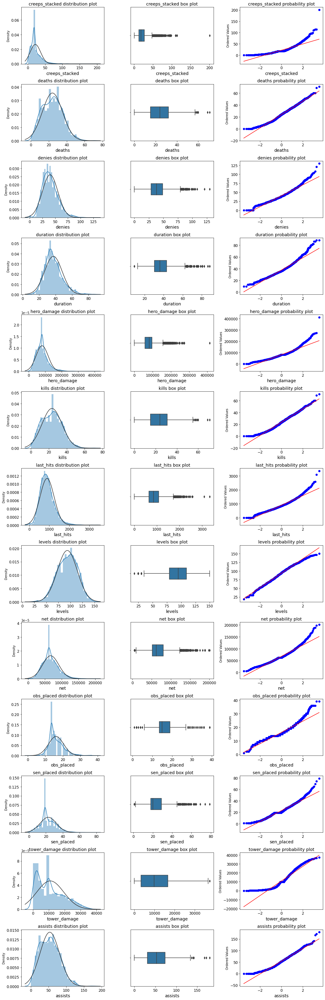

In [59]:
# list with only numerical columns
col_numerical = [col for col in plot_df.columns if plot_df[col].dtype != object]

    
# plot distributions
dist_plots(final_team_details_df.drop(['xpm'], axis=1),col_numerical)

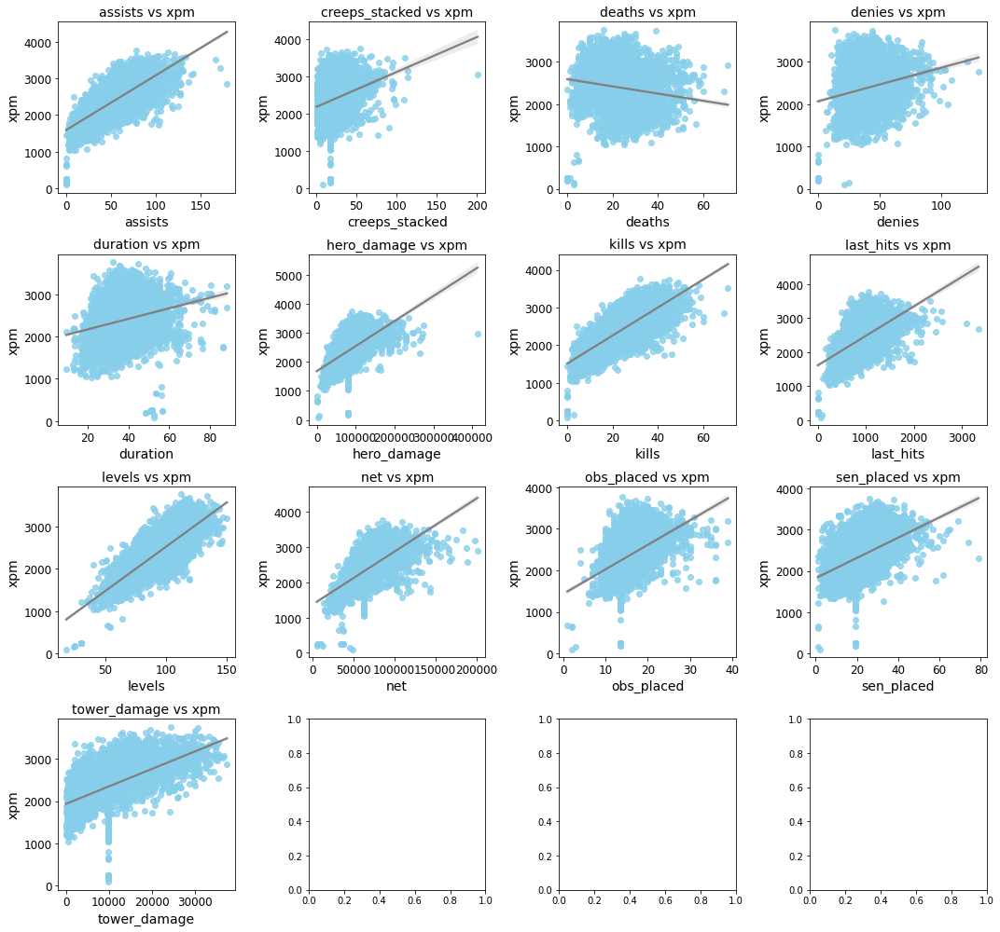

In [57]:
subplot_scatter(final_team_details_df,col_numerical)

## Skewed features

The table below shows the top 10 most skewed features and their Fisher-Pearson coefficient of skewness.

In [31]:
from scipy.stats import skew

skewed = final_team_details_df[col_numerical].apply(lambda x: skew(x.astype(float)))
skewed = skewed
skewed_df = pd.DataFrame({'skewed':skewed})
skewed_df.skewed.sort_values(ascending=False).head(10)

creeps_stacked   2.13
hero_damage      1.36
obs_placed       1.10
last_hits        0.90
net              0.87
duration         0.81
denies           0.75
tower_damage     0.74
sen_placed       0.68
assists          0.39
Name: skewed, dtype: float64

## Collinear features
---
### Correlation heatmap (of numerical columns)
From the heatmap it looks like some of the variables are highly correlated with each other.

garagecars and garagearea (garage area increases with increasing number of cars that can fit in it)
gotalrmsabvgrd and grlivarea (area increases with increasing number of rooms)
1stflrsf and totalbsmtsf (the first floor is on top of the basement, so they likely have similar size).

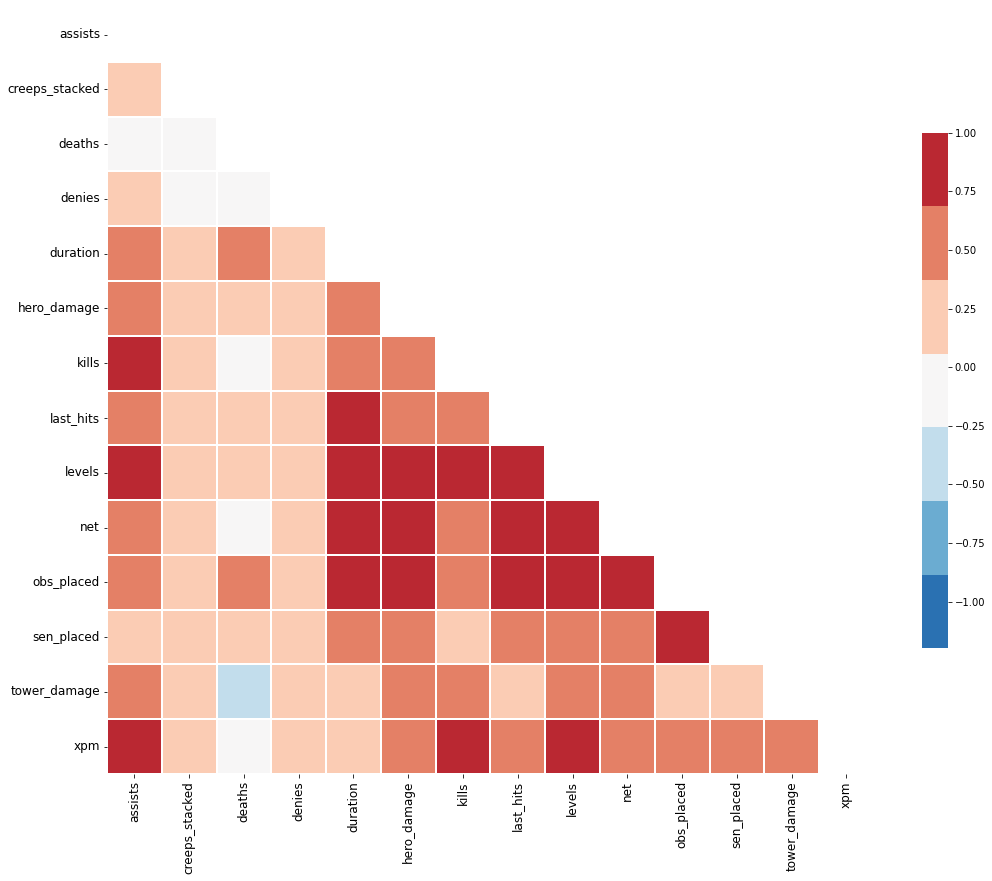

In [32]:

# order columns
final_team_details_df = final_team_details_df[final_team_details_df.columns.sort_values()]

# plot heatmap
mask = np.zeros_like(final_team_details_df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)]= True

f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(final_team_details_df.corr(),
            mask = mask,
            square=True,
            vmin = -1.2,
            vmax = 1,
            linewidth=0.1,
            cbar_kws = {'shrink':0.5},
            cmap=sns.color_palette("RdBu_r", 7))
ax.tick_params(labelsize=12)
plt.tight_layout()

In [33]:
train_dummies = pd.get_dummies(final_team_details_df, drop_first = True)

In [34]:
train_dummies

,assists,creeps_stacked,deaths,denies,duration,hero_damage,kills,last_hits,levels,net,obs_placed,sen_placed,tower_damage,xpm,name_Evil Geniuses,name_Fnatic,name_Nigma Galaxy,name_OG,name_PSG.LGD,name_Royal Never Give Up,name_Team Aster,name_Team Liquid,name_Team Secret,name_Team Spirit,name_Thunder Awaken,name_Tundra Esports
0,56,10.00,10,50,34.40,93866.00,35,1297,109,83794.00,17.00,32.00,15696.00,3231,0,0,0,0,0,1,0,0,0,0,0,0
1,24,3.00,35,29,34.40,55124.00,10,910,87,53947.00,17.00,28.00,1414.00,2203,0,0,0,0,0,0,1,0,0,0,0,0
2,77,16.00,28,49,44.33,102842.00,26,968,107,83236.00,16.00,22.00,11884.00,2295,0,0,0,0,0,0,0,1,0,0,0,0
3,86,14.00,28,21,44.33,100528.00,28,800,105,70296.00,17.00,16.00,11822.00,2168,0,0,0,1,0,0,0,0,0,0,0,0
4,35,18.19,7,25,18.70,81486.76,20,334,57,41901.00,13.50,19.03,9776.29,2064,0,0,0,0,0,0,0,0,1,0,0,0
5,11,18.19,20,16,18.70,81486.76,6,276,43,21757.00,13.50,19.03,9776.29,1253,0,0,0,0,1,0,0,0,0,0,0,0
6,80,15.00,12,33,30.36,98717.00,39,718,102,70088.00,15.00,8.00,19435.00,3078,0,0,0,0,0,0,0,0,1,0,0,0
7,24,22.00,40,38,30.36,62743.00,11,738,80,41739.00,15.00,19.00,3275.00,2055,0,0,0,1,0,0,0,0,0,0,0,0
8,63,25.00,13,72,28.46,64718.00,28,717,89,59222.00,14.00,19.00,16102.00,2623,0,0,0,0,0,0,0,1,0,0,0,0
9,23,32.00,29,25,28.46,57049.00,12,488,67,37328.00,13.00,11.00,5459.00,1592,1,0,0,0,0,0,0,0,0,0,0,0


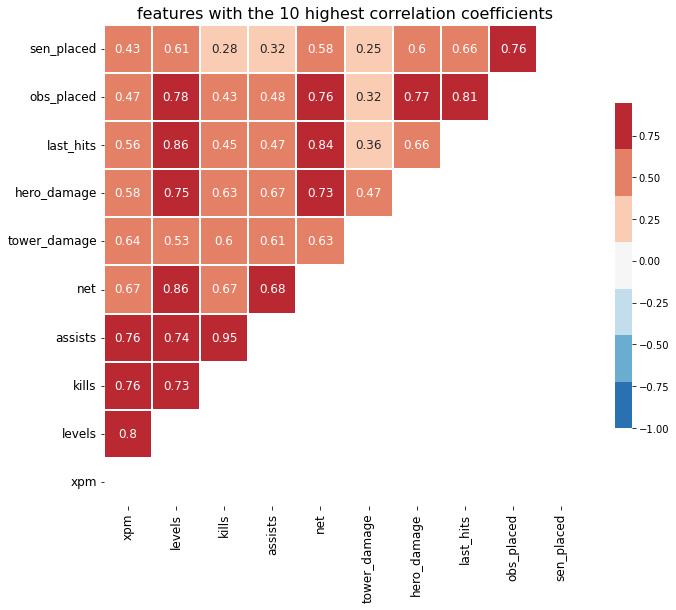

In [35]:
# get index of columns with 10 highest corrcoef wrt saleprice
corr_cols = train_dummies.corr().nlargest(10, 'xpm').index

# create heatmap
mask = np.zeros_like(train_dummies[corr_cols].corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)]= True

f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(train_dummies[corr_cols].corr(), 
            annot=True, 
            square= True, 
            mask = mask,
            cmap=sns.color_palette("RdBu_r", 7),
            annot_kws={'size': 12},
            cbar_kws={"shrink": 0.5},
            linewidth = 0.1,
            yticklabels=corr_cols.values, 
            xticklabels=corr_cols.values,
            vmin = -1)
ax.set_xlim(0,10)
ax.set_ylim(0,10)
ax.tick_params(labelsize=12)
plt.title('features with the 10 highest correlation coefficients', fontsize=16)
plt.tight_layout()

In [76]:
# Export Data
final_team_details_df.to_csv('train.csv')

## Conclusion
The above EDA revealed several issues with the data, such as the presence of null values and columns with skewed distributions. These features have been cleaned and preprocessed above.

From the EDA, one can already get a basic idea of the features that could most affect XPM, based on the relationship with XPM revealed in scatterplots and the correlation heatmap. Features such as `levels`, `kills`, `assists` and `net` are the most important factors affecting the experience gained per minute. Tower damage is also likely to be important. However, as categorical variables (such as the team names) were unable to be shown in these graphs, whether or not they would affect XPM would only be revealed in the next notebook - model building.